In [ ]:
import sys
python = sys.executable # get python executable path
print(python)

for i in ["numpy",  "scipy", "matplotlib", "pandas", "opencv-python", "opencv-contrib-python"]: # declare what packages we need
  # print(f"Installing: {i}")
  ! $python -m pip install $i # install packages calling bash command from the notebook, e.g. "/usr/bin/python -m pip install numpy"

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
import cv2

## Загрузка изображения

#### Web camera

In [36]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
from IPython.display import Image as IImage

# filename = take_photo()
# display(IImage(filename))

#### Internet image

In [2]:
# url = 'https://i.pinimg.com/564x/ec/9c/16/ec9c164f2fda80e6c7cdc6f62b19826c.jpg'
# url = 'https://i.pinimg.com/564x/92/e3/46/92e346c0344fb85e169e27c5cfb94b1d.jpg'
# url = 'https://i.pinimg.com/564x/0a/25/5d/0a255d80a59ea3a4ab819bc135b87037.jpg'
# url = 'https://i.pinimg.com/564x/ea/69/83/ea69836f6adaf8e544bc37b4ac0d522d.jpg'
url = 'https://i.pinimg.com/564x/55/bd/ee/55bdeef4f81a82f1dcea29d194b0b6cd.jpg'
urllib.request.urlretrieve(url, "image.jpg")

('image.jpg', <http.client.HTTPMessage at 0x7fad5c631c70>)

In [108]:
# image = np.array(Image.open('photo.jpg'))
image = np.array(Image.open('image.jpg'))

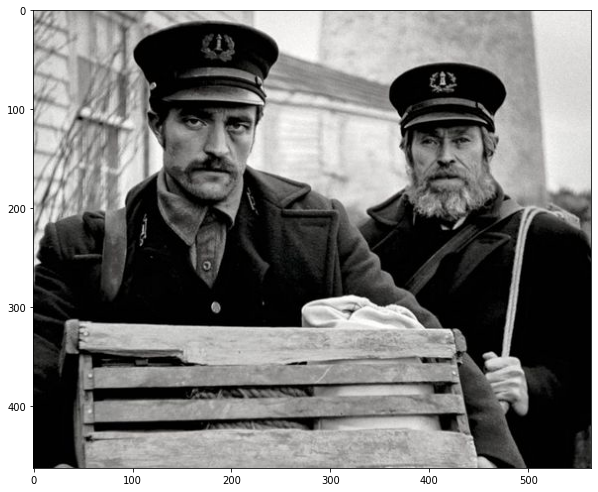

In [109]:
fig = plt.figure(figsize = (10, 10))
plt.imshow(image)
plt.show()

# Задание 1 Работа с шумом


1. Сгенерировать различные типы шумов с разными параметрами (шум соль(3 варианта параметра) и перец, гауссов шум(3 варианта параметра)), наложить на изображение и отобразить результаты
2. Применить фильтры на зашумленных изображениях (box filter, фильтр гаусса, медианный фильтр)
3. Отобразить результаты



In [110]:
def noise_sp(image, kind='salt & pepper', amount = 0.02, s_vs_p = 0.5):
  noised_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  if 'salt' in kind:
    num_noise = np.ceil(amount * noised_image.size * s_vs_p)
    coords = tuple([np.random.randint(0, i - 1, int(num_noise)) for i in noised_image.shape])
    noised_image[coords] = 255
  if 'pepper' in kind:
    num_noise = np.ceil(amount * noised_image.size * (1. - s_vs_p))
    coords = tuple([np.random.randint(0, i - 1, int(num_noise)) for i in noised_image.shape])
    noised_image[tuple(coords)] = 0
  return noised_image

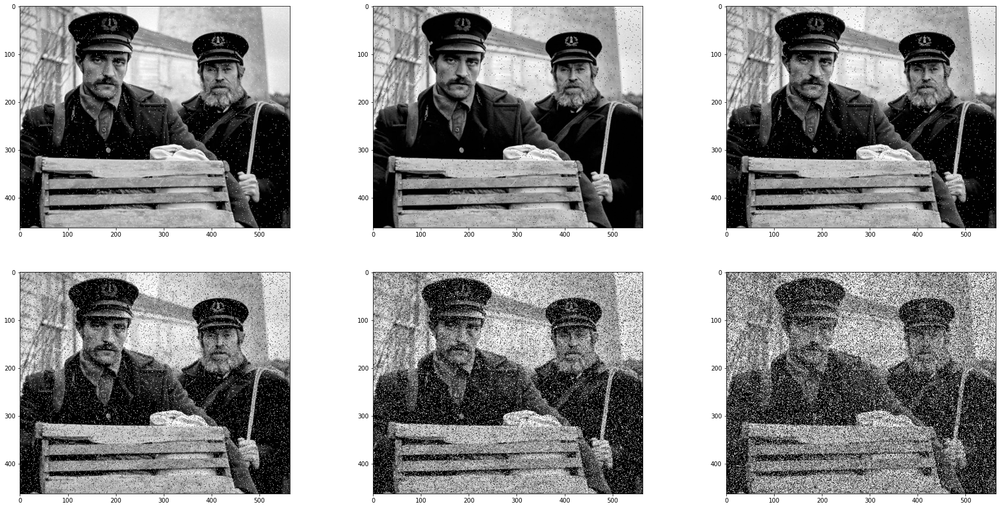

In [111]:
fig, ax = plt.subplots(2, 3, figsize=(30, 15))

salt_image = noise_sp(image, kind='salt')
pepper_image = noise_sp(image, kind='pepper')
salt_pepper_image = noise_sp(image, kind='salt & pepper')
salt_pepper_tenth_image = noise_sp(image, amount=0.1)
salt_pepper_quarter_image = noise_sp(image, amount=0.25)
salt_pepper_half_image = noise_sp(image, amount=0.5)

ax[0, 0].imshow(salt_image, 'gray')
ax[0, 1].imshow(pepper_image, 'gray')
ax[0, 2].imshow(salt_pepper_image, 'gray')
ax[1, 0].imshow(salt_pepper_tenth_image, 'gray')
ax[1, 1].imshow(salt_pepper_quarter_image, 'gray')
ax[1, 2].imshow(salt_pepper_half_image, 'gray')

In [112]:
def noise_gauss(image, mean=0, sigma=10):
  noised_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gauss = np.random.normal(mean, sigma, noised_image.shape)
  noised_image = noised_image.astype(np.float64) + gauss.astype(np.float64)
  noised_image = ((noised_image - np.min(noised_image)) / (np.max(noised_image) - np.min(noised_image))) * 255
  return noised_image.astype(np.uint8)

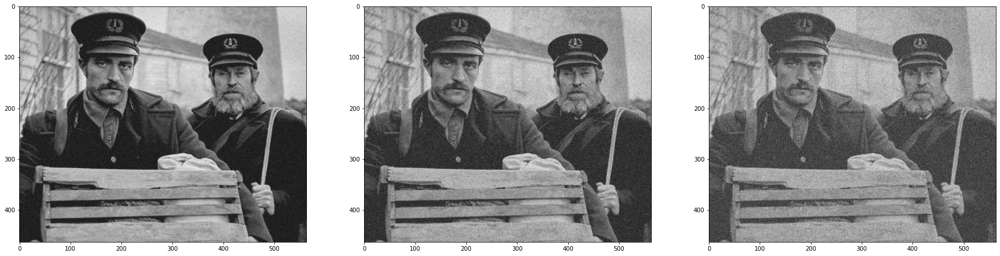

In [113]:
fig, ax = plt.subplots(1, 3, figsize=(30, 15))

gauss_low_sigma_image = noise_gauss(image, sigma=10)
gauss_mid_sigma_image = noise_gauss(image, sigma=20)
gauss_high_sigma_image = noise_gauss(image, sigma=30)

ax[0].imshow(gauss_low_sigma_image, 'gray')
ax[1].imshow(gauss_mid_sigma_image, 'gray')
ax[2].imshow(gauss_high_sigma_image, 'gray')

In [114]:
images = [
    salt_pepper_image,
    salt_pepper_tenth_image,
    salt_pepper_quarter_image,
    gauss_low_sigma_image,
    gauss_mid_sigma_image,
    gauss_high_sigma_image
]

In [115]:
def convolve(image, kernel):
  if kernel.shape[0] % 2 != 1 or kernel.shape[1] % 2 != 1:
    raise ValueError("Only odd dimensions on filter supported") 

  _image = np.copy(image)
  if len(_image.shape)==3:
    _image = cv2.cvtColor(_image, cv2.COLOR_BGR2GRAY)

  image_height = _image.shape[0]
  image_width = _image.shape[1]
  pad_height = kernel.shape[0] // 2
  pad_width = kernel.shape[1] // 2

  pad = ((pad_height, pad_height), (pad_height, pad_width))
  output = np.empty(_image.shape, dtype=np.float64)
  _image = cv2.copyMakeBorder(_image, pad_height, pad_width, pad_height, pad_width, cv2.BORDER_REPLICATE)

  for y in np.arange(pad_height, image_height+pad_height):
    for x in np.arange(pad_width, image_width+pad_width):
      part = _image[y - pad_height:y + pad_height + 1, x - pad_width:x + pad_width + 1]
      output[y - pad_height, x - pad_width] = (part * kernel).sum()

  if (output.dtype == np.float64):
    kernel = kernel / 255.0
    kernel = (kernel*255).astype(np.uint8)
  else:
    output = output + abs(np.amin(output))
    output = output / np.amax(output)
    output = (output*255.0)
  return output

In [116]:
def linear_blur(image, size=3):
  kernel = np.ones((size, size), np.float32) / size**2
  blur_image = cv2.filter2D(image, -1, kernel)
  return blur_image


def linear_blur_implementation(image, size=3):
  kernel = np.ones((size, size), np.float32) / size**2
  blur_image = convolve(image, kernel)
  return blur_image

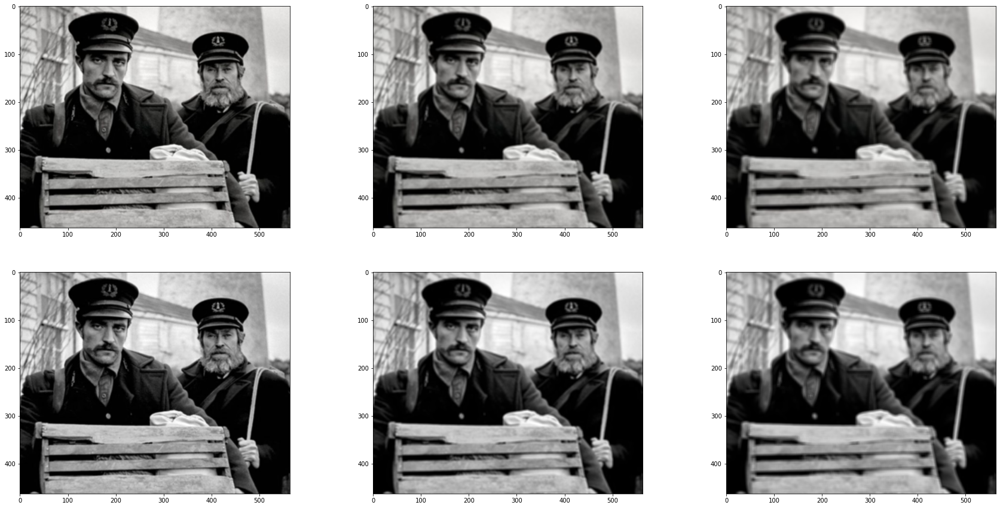

In [117]:
fig, ax = plt.subplots(2, 3, figsize=(30, 15))

blur_low_image = linear_blur(image, size = 3)
blur_mid_image = linear_blur(image, size = 5)
blur_high_image = linear_blur(image, size = 7)

blur_low_image_2 = linear_blur_implementation(image, size = 3)
blur_mid_image_2 = linear_blur_implementation(image, size = 5)
blur_high_image_2 = linear_blur_implementation(image, size = 7)

ax[0, 0].imshow(blur_low_image, 'gray')
ax[0, 1].imshow(blur_mid_image, 'gray')
ax[0, 2].imshow(blur_high_image, 'gray')

ax[1, 0].imshow(blur_low_image_2, 'gray')
ax[1, 1].imshow(blur_mid_image_2, 'gray')
ax[1, 2].imshow(blur_high_image_2, 'gray')

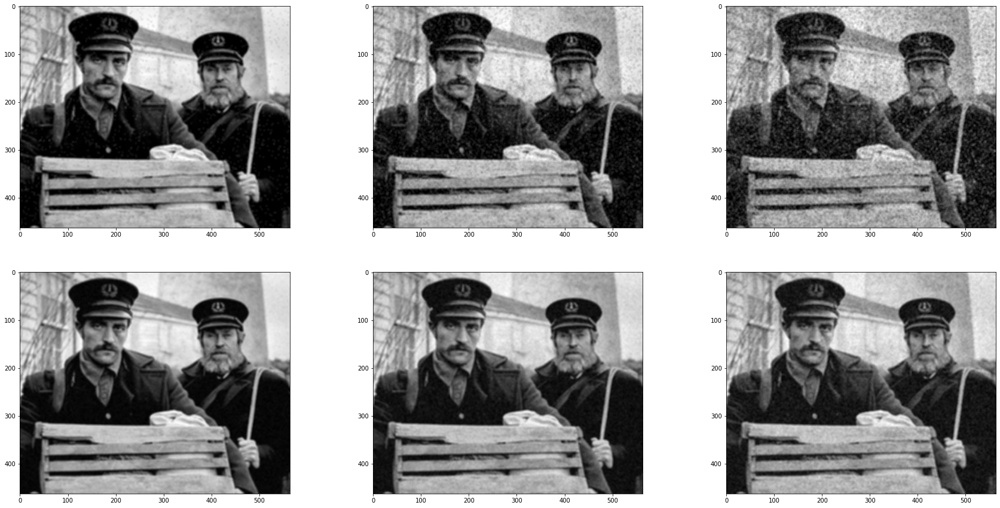

In [118]:
shape = (2, 3)

fig, ax = plt.subplots(shape[0], shape[1], figsize=(30, 15))

blur_images = [linear_blur_implementation(img, size=5) for img in images]

k=0
for i in range(shape[0]):
  for j in range(shape[1]):
    ax[i, j].imshow(blur_images[k], 'gray')
    k+=1

In [119]:
def get_gauss_kernel(size=5, sigma=1):
  ax = np.linspace(-(size - 1) / 2, (size - 1) / 2, size)
  gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
  kernel = np.outer(gauss, gauss)
  return kernel / np.sum(kernel)


def gauss_blur_implementation(image, size=3, sigma=1):
  kernel = get_gauss_kernel(size=size, sigma=sigma)
  blur_image = convolve(image, kernel)
  return blur_image

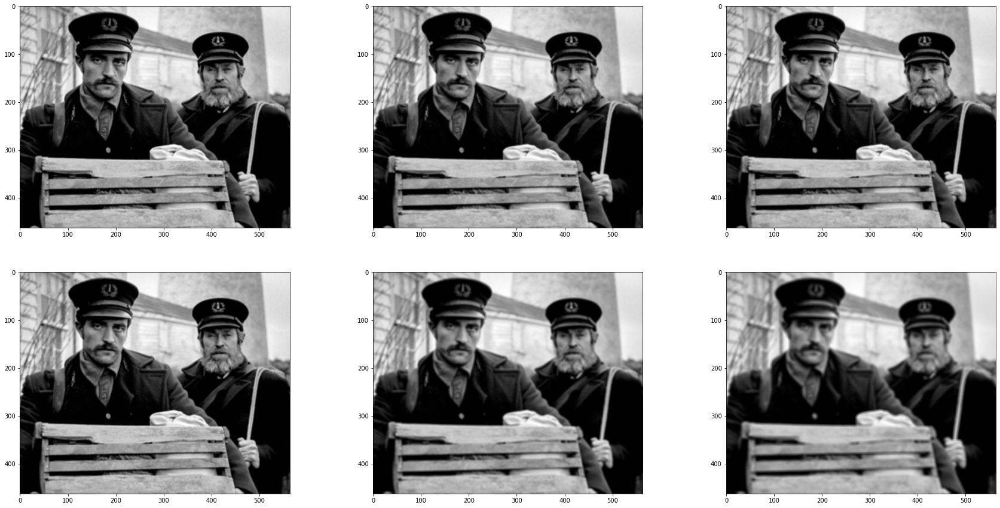

In [120]:
fig, ax = plt.subplots(2, 3, figsize=(30, 15))

blur_low_image = gauss_blur_implementation(image, size = 3)
blur_mid_image = gauss_blur_implementation(image, size = 5)
blur_high_image = gauss_blur_implementation(image, size = 7)

blur_low_image_2 = gauss_blur_implementation(image, size = 3, sigma=3)
blur_mid_image_2 = gauss_blur_implementation(image, size = 5, sigma=5)
blur_high_image_2 = gauss_blur_implementation(image, size = 7, sigma=7)

ax[0, 0].imshow(blur_low_image, 'gray')
ax[0, 1].imshow(blur_mid_image, 'gray')
ax[0, 2].imshow(blur_high_image, 'gray')

ax[1, 0].imshow(blur_low_image_2, 'gray')
ax[1, 1].imshow(blur_mid_image_2, 'gray')
ax[1, 2].imshow(blur_high_image_2, 'gray')

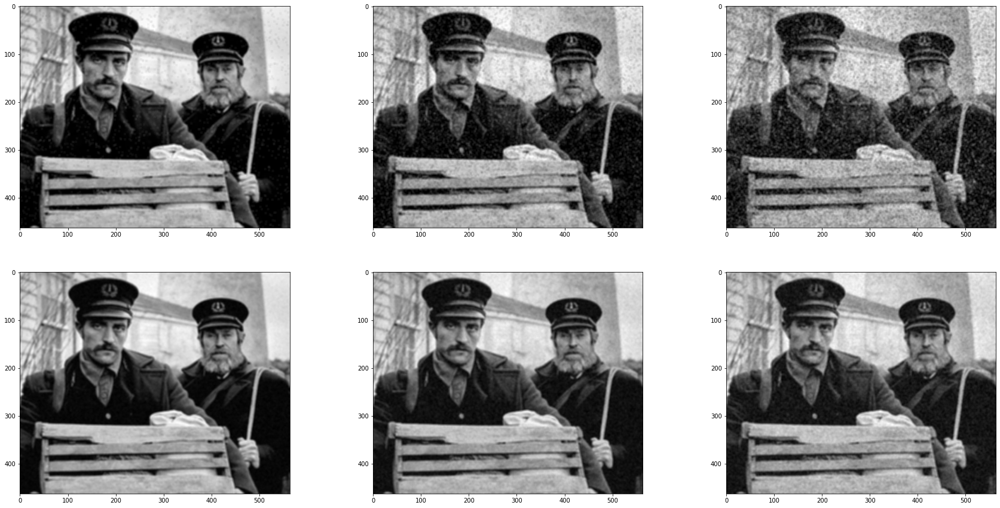

In [121]:
shape = (2, 3)

fig, ax = plt.subplots(shape[0], shape[1], figsize=(30, 15))

blur_images = [gauss_blur_implementation(img, size=5, sigma=5) for img in images]

k=0
for i in range(shape[0]):
  for j in range(shape[1]):
    ax[i, j].imshow(blur_images[k], 'gray')
    k+=1

In [122]:
def median_blur(image, size=3):
  return cv2.medianBlur(image, size)


def median_blur_implementation(image, size=3):
  base = np.copy(image)
  if len(image.shape)==3:
    base = cv2.cvtColor(base, cv2.COLOR_BGR2GRAY)
  (iH, iW) = base.shape[:2]
  (kH, kW) = (size, size)
  pad = (kW - 1) // 2
  base = cv2.copyMakeBorder(base, pad, pad, pad, pad, cv2.BORDER_REPLICATE)
  output = np.zeros((iH, iW), dtype=np.float32)
  for y in np.arange(pad, iH + pad):
    for x in np.arange(pad, iW + pad):
      part = base[y - pad:y + pad + 1, x - pad:x + pad + 1]
      output[y - pad, x - pad] = np.median(part)

  if (output.dtype == np.float64):
    kernel = kernel / 255.0
    kernel = (kernel*255).astype(np.uint8)
  else:
    output = output + abs(np.amin(output))
    output = output / np.amax(output)
    output = (output*255.0)
  return output

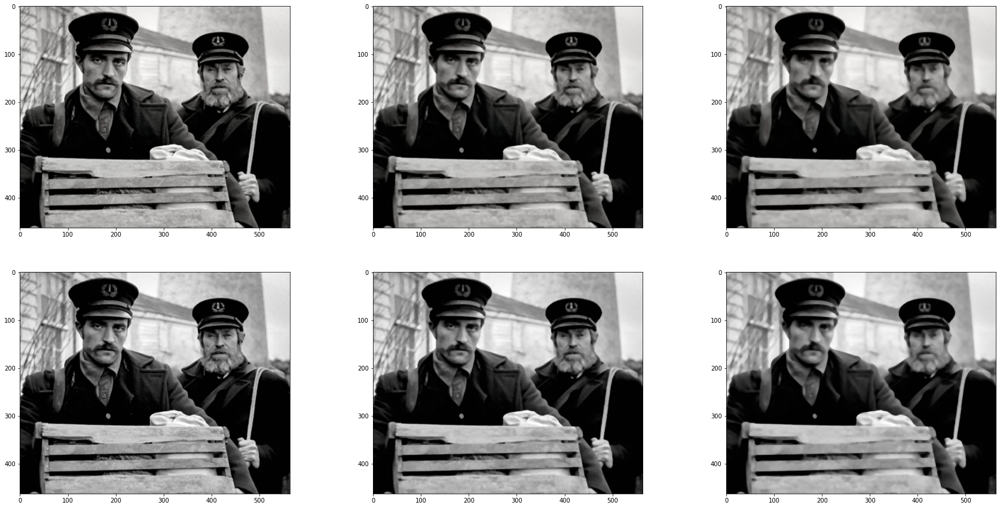

In [123]:
fig, ax = plt.subplots(2, 3, figsize=(30, 15))

blur_low_image = median_blur(image, size = 3)
blur_mid_image = median_blur(image, size = 5)
blur_high_image = median_blur(image, size = 7)

blur_low_image_2 = median_blur_implementation(image, size = 3)
blur_mid_image_2 = median_blur_implementation(image, size = 5)
blur_high_image_2 = median_blur_implementation(image, size = 7)

ax[0, 0].imshow(blur_low_image, 'gray')
ax[0, 1].imshow(blur_mid_image, 'gray')
ax[0, 2].imshow(blur_high_image, 'gray')

ax[1, 0].imshow(blur_low_image_2, 'gray')
ax[1, 1].imshow(blur_mid_image_2, 'gray')
ax[1, 2].imshow(blur_high_image_2, 'gray')

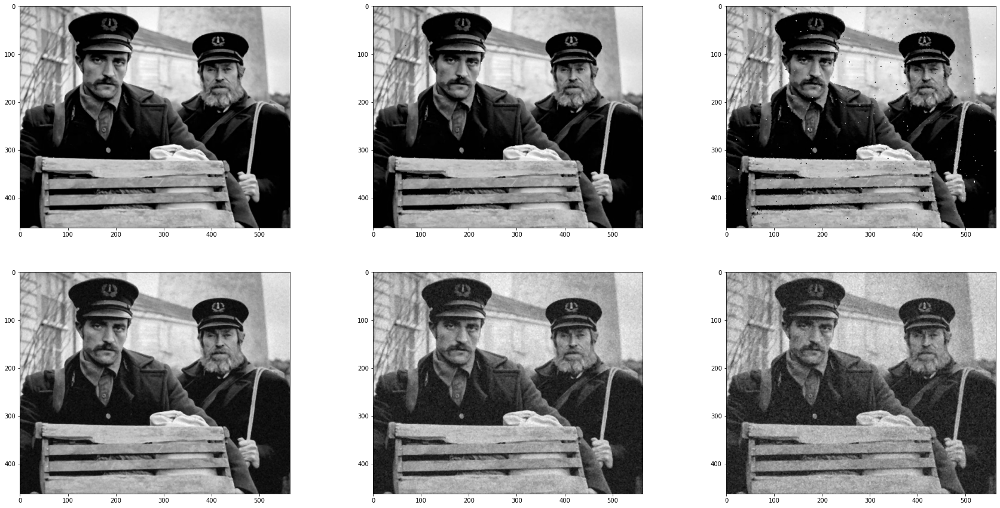

In [124]:
shape = (2, 3)

fig, ax = plt.subplots(shape[0], shape[1], figsize=(30, 15))

blur_images = [median_blur_implementation(img, size = 3) for img in images]

k=0
for i in range(shape[0]):
  for j in range(shape[1]):
    ax[i, j].imshow(blur_images[k], 'gray')
    k+=1

# Задание 2 Детектор границ Canny

1. Имплементировать алгоритм детектора границ Canny
2. Отобразить производную по x, y на изображении
3. Отобразить результат применения детектора границ на изображении


In [125]:
def sobel_edge_detection(image, filter=np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]), verbose=False):
    _image = np.copy(image)
    if verbose:
      fig, ax = plt.subplots(1, 3, figsize=(30, 15))

    new_image_x = convolve(_image, filter)
    if verbose:
        ax[0].imshow(new_image_x, cmap='gray')
        ax[0].set_title("Horizontal Edge")

    new_image_y = convolve(_image, np.flip(filter.T, axis=0))
    if verbose:
        ax[1].imshow(new_image_y, cmap='gray')
        ax[1].set_title("Vertical Edge")

    gradient_magnitude = np.sqrt(np.square(new_image_x.astype(np.float32)) + np.square(new_image_y.astype(np.float32)))
    gradient_magnitude *= (255.0 / gradient_magnitude.max())
    if verbose:
        ax[2].imshow(gradient_magnitude, cmap='gray')
        ax[2].set_title("Gradient Magnitude")
 
    return gradient_magnitude

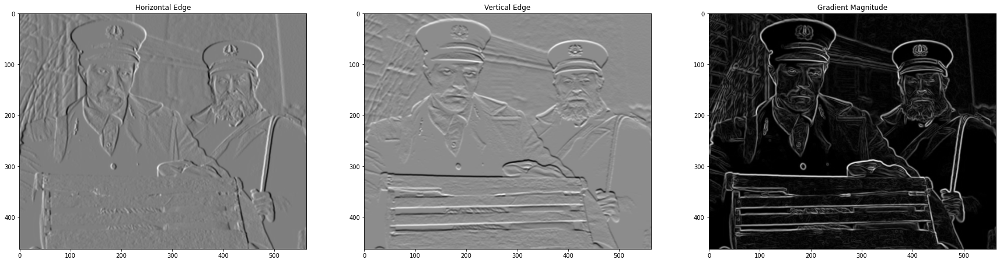

In [126]:
sed1 = sobel_edge_detection(gauss_blur_implementation(image, size=3, sigma=3), verbose=True)

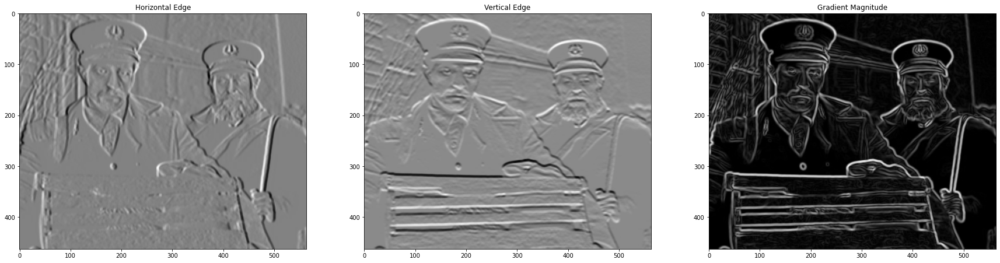

In [127]:
sed2 = sobel_edge_detection(gauss_blur_implementation(image, size=5, sigma=5), verbose=True)

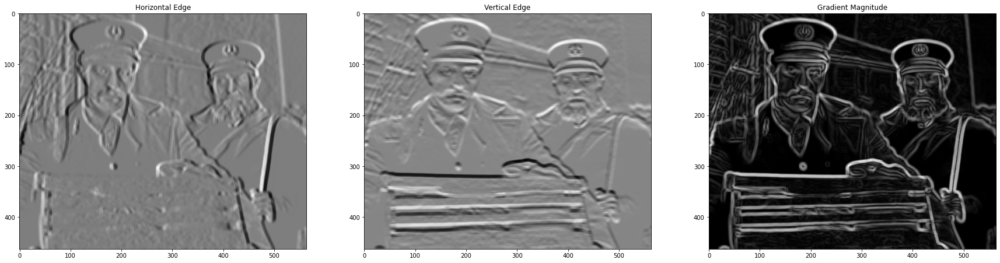

In [128]:
sed3 = sobel_edge_detection(gauss_blur_implementation(image, size=7, sigma=7), verbose=True)

In [129]:
def non_maximum_suppresion(image, size=3, verbose=False):
  _image = np.copy(image)

  if verbose:
    fig, ax = plt.subplots(figsize=(10, 8))

  (iH, iW) = _image.shape[:2]
  (kH, kW) = (size, size)
  pad = (kW - 1) // 2
  _image = cv2.copyMakeBorder(_image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)
  output = np.zeros((iH, iW), dtype=np.float32)
  for y in np.arange(pad, iH + pad):
    for x in np.arange(pad, iW + pad):
      part = _image[y - pad:y + pad + 1, x - pad:x + pad + 1]
      bottom_left = part[-1, 0]
      top_right = part[0, -1]
      middle = part[(size-1)//2, (size-1)//2]
      if middle < bottom_left and middle < top_right:
        output[y - pad, x - pad] = 0
      if bottom_left < middle and middle > top_right:
        output[y - pad, x - pad] = middle

  if verbose:
    plt.imshow(output, 'gray')

  return output

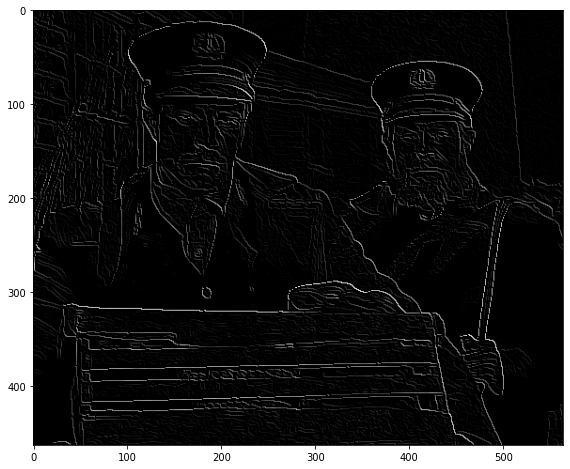

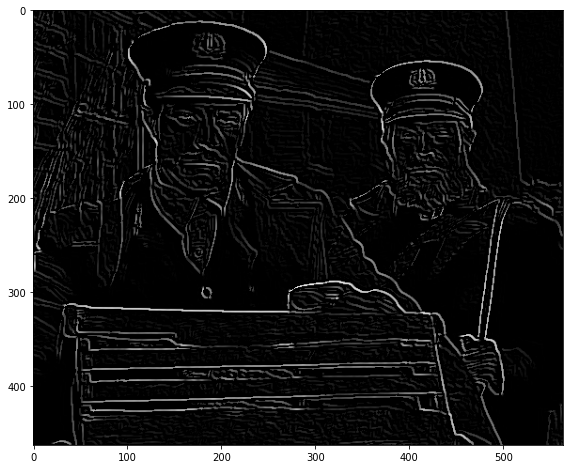

In [130]:
nms1 = non_maximum_suppresion(sed1, size=3, verbose=True)
nms2 = non_maximum_suppresion(sed1, size=5, verbose=True)

In [131]:
def threshold(image, value=85, verbose=False):
  _image = np.copy(image)

  if verbose:
    fig, ax = plt.subplots(figsize=(10, 8))
  
  _image[_image < value] = 0
  # _image[_image > value] = 255

  if verbose:
    plt.imshow(_image, 'gray')

  return _image


def merge_threshold(image, T=85, t=30, size=3, verbose=False):
  _image = np.copy(image)

  if verbose:
    fig, ax = plt.subplots(figsize=(10, 8))
  
  _image[_image > T] = 255
  _image[_image < t] = 0

  (iH, iW) = _image.shape[:2]
  (kH, kW) = (size, size)
  pad = (kW - 1) // 2
  _image = cv2.copyMakeBorder(_image, pad, pad, pad, pad, cv2.BORDER_REPLICATE)
  for y in np.arange(pad, iH + pad):
    for x in np.arange(pad, iW + pad):
      part = _image[y - pad:y + pad + 1, x - pad:x + pad + 1]
      middle = part[(size-1)//2, (size-1)//2]
      if (middle > 0 and middle < 255) and (255 in part):
        _image[y - pad, x - pad] = 255
      elif 255 not in part:
        _image[y - pad, x - pad] = 0

  if verbose:
    plt.imshow(_image, 'gray')

  return _image

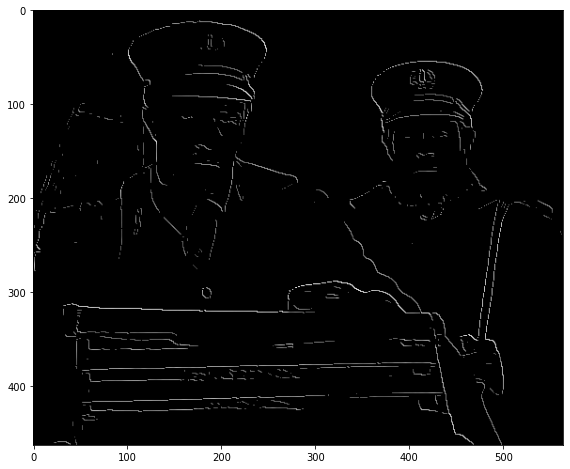

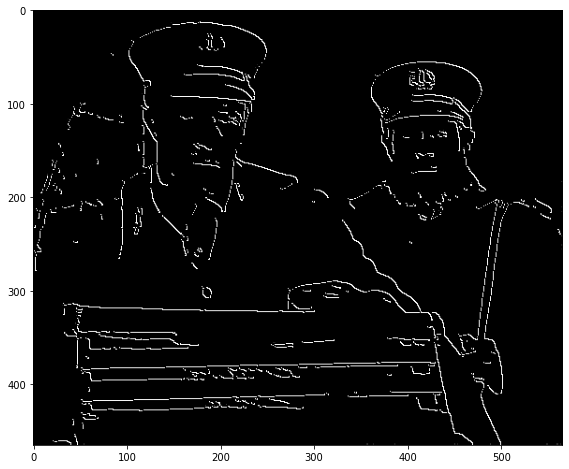

In [132]:
thr1 = threshold(nms1, value=85, verbose=True)
thrm1 = merge_threshold(nms1, T=85, t=30, size=3, verbose=True)

In [133]:
def canny_edge_detection(image, blur_size=3, blur_sigma=3, nms_size=3, T=85, t=55, verbose=False):
  _image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  _image = gauss_blur_implementation(_image, size=blur_size, sigma=blur_sigma)
  _image = sobel_edge_detection(_image, verbose=verbose)
  _image = non_maximum_suppresion(_image, size=nms_size, verbose=verbose)
  _image = merge_threshold(_image, verbose=verbose)
  return _image

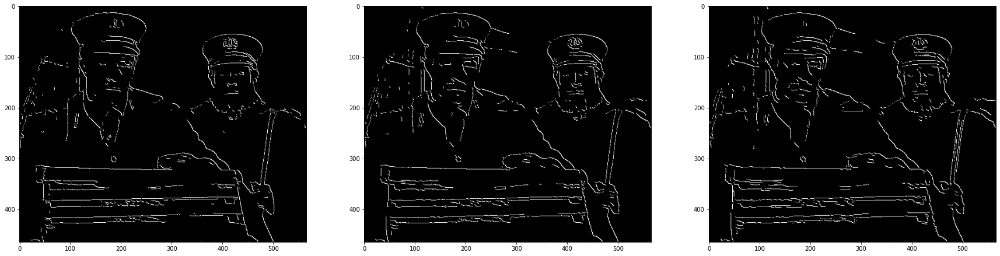

In [134]:
fig, ax = plt.subplots(1, 3, figsize=(30, 15))

first_image = canny_edge_detection(image, blur_size=3, blur_sigma=3, nms_size=3, T=85, t=55, verbose=False)
second_image = canny_edge_detection(image, blur_size=5, blur_sigma=5, nms_size=3, T=105, t=45, verbose=False)
third_image = canny_edge_detection(image, blur_size=7, blur_sigma=7, nms_size=3, T=125, t=35, verbose=False)

ax[0].imshow(first_image, 'gray')
ax[1].imshow(second_image, 'gray')
ax[2].imshow(third_image, 'gray')

In [135]:
# image = np.array(Image.open('image.jpg'))

In [136]:
# fig = plt.figure(figsize = (10, 10))
# plt.imshow(image)
# plt.show()

In [137]:
# fig, ax = plt.subplots(1, 3, figsize=(30, 15))

# first_image = canny_edge_detection(image, blur_size=3, blur_sigma=3, nms_size=3, T=85, t=55, verbose=False)
# second_image = canny_edge_detection(image, blur_size=5, blur_sigma=5, nms_size=3, T=105, t=45, verbose=False)
# third_image = canny_edge_detection(image, blur_size=7, blur_sigma=7, nms_size=3, T=125, t=35, verbose=False)

# ax[0].imshow(first_image, 'gray')
# ax[1].imshow(second_image, 'gray')
# ax[2].imshow(third_image, 'gray')

# Задание 3 Детектор углов Харриса

1. Реализовать алгоритм детектора границ Харриса detect_harris(img, ...)
2. Отобразить точки найденные алгоритмом на изображении
3. Используется «серое» изображение
4. Не забудьте про сглаживание!


In [138]:
def detect_harris(image, T=0.75, circle_size=1, circle_color=(255,0,255), verbose=False):
  _image = image.copy()
  _gray = cv2.cvtColor(_image, cv2.COLOR_BGR2GRAY)

  if verbose:
    fig, ax = plt.subplots(figsize=(10, 10))

  SOBEL = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype="int32")
  dx = convolve(_gray, SOBEL)
  dy = convolve(_gray, np.flip(SOBEL.T, axis=0))

  dx2 = np.square(dx)
  dy2 = np.square(dy)
  dxdy = dx*dy

  GAUSS = get_gauss_kernel(size=3, sigma=1).astype(np.float64)
  g_dx2 = convolve(dx2, GAUSS)
  g_dy2 = convolve(dy2, GAUSS)
  g_dxdy = convolve(dxdy, GAUSS)

  harris = g_dx2*g_dy2 - np.square(g_dxdy) - 0.12*np.square(g_dx2 + g_dy2) # r(harris) = det - k*(trace**2)

  cv2.normalize(harris, harris, 0, 1, cv2.NORM_MINMAX)

  loc = np.where(harris >= T)

  for p in zip(*loc[::-1]):
    cv2.circle(_image, p, circle_size, circle_color, -1)

  if verbose:
    plt.imshow(_image, cmap='gray')

  return _image, loc

In [139]:
# photo = np.array(Image.open('photo.jpg'))

In [140]:
# corners, loc = detect_harris(photo, T=0.665, circle_size=3, circle_color=(255,0,255), verbose=True)

In [141]:
# from google.colab.patches import cv2_imshow

# cv_image = cv2.imread('photo.jpg')
  
# operatedImage = cv2.cvtColor(cv_image, cv2.COLOR_BGR2GRAY)
  
# operatedImage = np.float32(operatedImage)

# dest = cv2.cornerHarris(operatedImage, 3, 5, 0.07)
  
# dest = cv2.dilate(dest, None)

# cv_image[dest > 0.01 * dest.max()]=[0, 255, 0]

# cv2_imshow(cv_image)

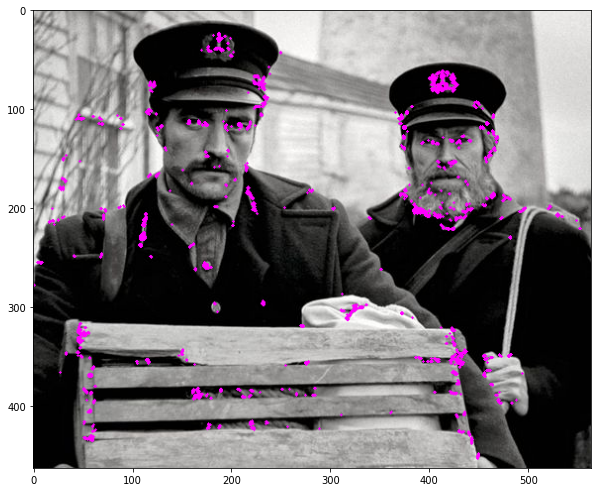

In [142]:
corners, loc = detect_harris(image, T=0.785, circle_size=1, circle_color=(255,0,255), verbose=True)

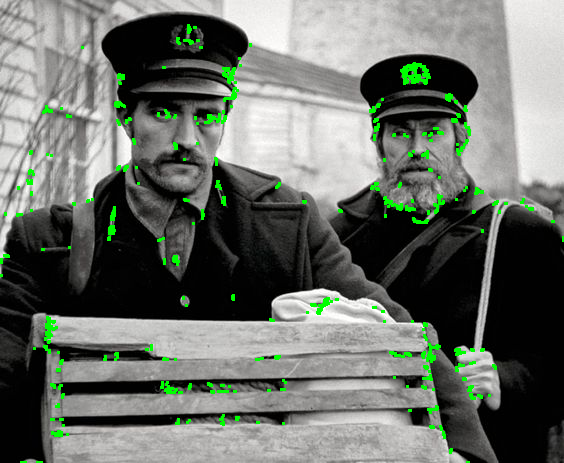

In [143]:
from google.colab.patches import cv2_imshow

cv_image = cv2.imread('image.jpg')
  
operatedImage = cv2.cvtColor(cv_image, cv2.COLOR_BGR2GRAY)
  
operatedImage = np.float32(operatedImage)

dest = cv2.cornerHarris(operatedImage, 2, 5, 0.07)
  
dest = cv2.dilate(dest, None)

cv_image[dest > 0.01 * dest.max()]=[0, 255, 0]

cv2_imshow(cv_image)